<a href="https://colab.research.google.com/github/Rifat951/AI_Spectrum/blob/main/decryptwithSeed.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [8]:
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image as im


def LFSR(N, c, seed):
    LFSR_output = np.zeros(N)
    m = np.size(c)
    state = seed
    for i in range(0, N):
        next_bit = np.mod(np.sum(c*state), 2)
        LFSR_output[i] = state[m-1]
        state = np.concatenate((np.array([next_bit]), state[0:m-1]))
    return LFSR_output



# relative path to encrypted image
encrypted_img_file = '/content/image3_binary_crypt_sol_145.npy'
# encrypted_img_file = '../Encrypted images/ISAE_Logo_SEIS_clr_new.npy'
image_shape = (200, 200, 3)  # shape of the image (useful constant)

# connections vector
c = np.array([1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1])
seed1 = np.array([0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0,
                1, 0, 1, 1, 1])  # initial state from the example

seed = np.array([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
                 1, 0, 0, 0, 1])  # initial state from 2^^16

# *****************************************************************************
#        Transmitter: Compression  + encryption
# *****************************************************************************


## iteration for the seeeedoooooooooo

myfile = open('bitfile.txt', 'w')
# for line in lines:
#     var1, var2 = line.split(",");
#     myfile.write("%s\n" % var1)

for seed_no in range(0, 2**16):

    seed_str = '{:016b}'.format(seed_no)
    seed = [int(bit) for bit in seed_str]
    myfile.write('Initial bit {} ({}/{}) \n'.format(seed_str, seed_no, 2**16))    
    
myfile.close()


# for seed_no in range(0, 2**16):

#     seed_str = '{:016b}'.format(seed_no)
#     seed = [int(bit) for bit in seed_str]
#     print('Initial bit {} ({}/{})'.format(seed_str, seed_no, 2**16))

### better to save this into a file

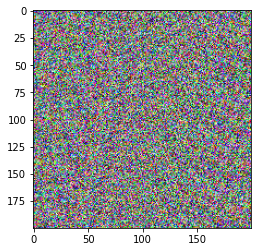

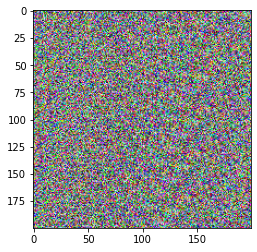

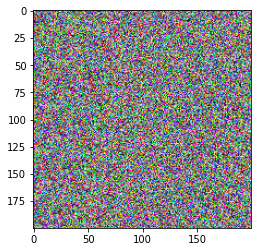

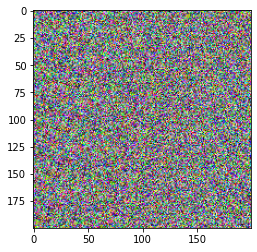

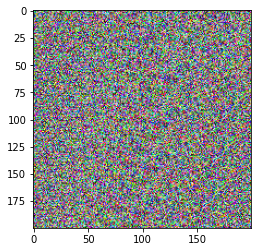

...

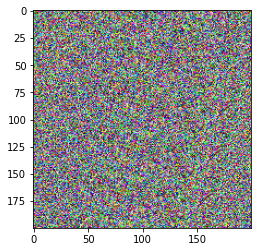

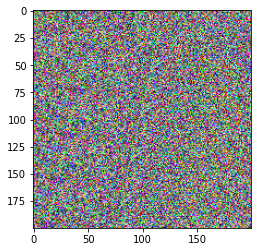

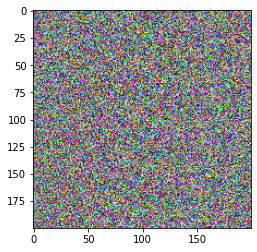

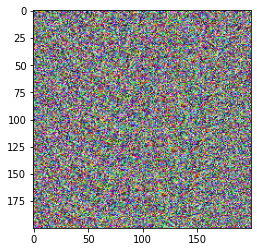

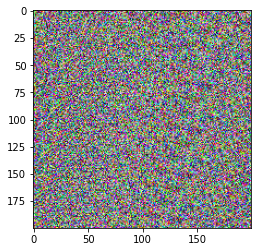

In [ ]:
# Initializations

for seed_no in range(0, 2**16):

    seed_str = '{:016b}'.format(seed_no)
    seed = [int(bit) for bit in seed_str]
   # print('Trying seed {} ({}/{})'.format(seed_str, seed_no, 2**16))

    # Initializations
    image_rec_plane = np.zeros(image_shape, dtype=np.uint8)
    image_binary_plane = np.zeros(image_shape)

    # Create the stream cipher
    stream_cipher = LFSR(200*200*8*3, c, seed)

    # Read the encrypted image from memory
    image_binary_crypt = np.load(encrypted_img_file)

    # *****************************************************************************
    #            Receiver:  decryption + decompression
    # *****************************************************************************

    # ---------------- Decryption: stream cipher -----------

    # Recover the stream cipher
    stream_cipher_rec = stream_cipher

    # Decrypt using the stream cipher
    image_binary_decrypt = np.mod(image_binary_crypt + stream_cipher_rec, 2)

    # --------------- Decompression --------------------

    # From binary to image
    image_binary_decrypt_plane = np.reshape(
        image_binary_decrypt, (200*200*8, 3))
    for i_plane in range(0, 3):
        ctr = 0
        for i in range(0, np.size(image_rec_plane, 0)):
            for j in range(0, np.size(image_rec_plane, 1)):
                image_rec_plane[i, j, i_plane] = (np.sum(
                    image_binary_decrypt_plane[ctr:ctr+8, i_plane]*np.array([128, 64, 32, 16, 8, 4, 2, 1])))
                ctr += 8

    # Recovering the image from the array of RGB
    image_rec = im.fromarray(image_rec_plane)
    plt.imshow(image_rec)
    plt.show()


    cutoff_occurences = 300

    # histogram of the image
    hist_r = np.histogram(np.reshape(
        image_rec_plane[:, :, 0], 200*200), bins=256)
    if np.max(hist_r[0]) >= cutoff_occurences:
        hist_g = np.histogram(np.reshape(image_rec_plane[:, :, 1],
                                         200*200), bins=256)
        if np.max(hist_g[0]) >= cutoff_occurences:
            hist_b = np.histogram(np.reshape(
                image_rec_plane[:, :, 2], 200*200), bins=256)
            if np.max(hist_b[0]) >= cutoff_occurences:
                # histogram of the image
                hist_r = plt.hist(np.reshape(image_rec_plane[:, :, 0], 200*200), color='red', bins=256)
                hist_g = plt.hist(np.reshape(image_rec_plane[:, :, 1],200*200), color='green', bins=256)
                hist_b = plt.hist(np.reshape(image_rec_plane[:, :, 2], 200*200), color='blue', bins=256)
                plt.show()

                # Plot the image
